In [ ]:
##Importing the libraries

In [1]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
import cv2
from google.colab.patches import cv2_imshow
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D,MaxPool2D,Flatten,Dense
from tensorflow.keras.preprocessing.image import ImageDataGenerator
tf.__version__

'2.7.0'

In [ ]:
##Loading the Images

In [2]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [3]:
path='/content/gdrive/MyDrive/Sunik_sample_data/Cyclone_Images'

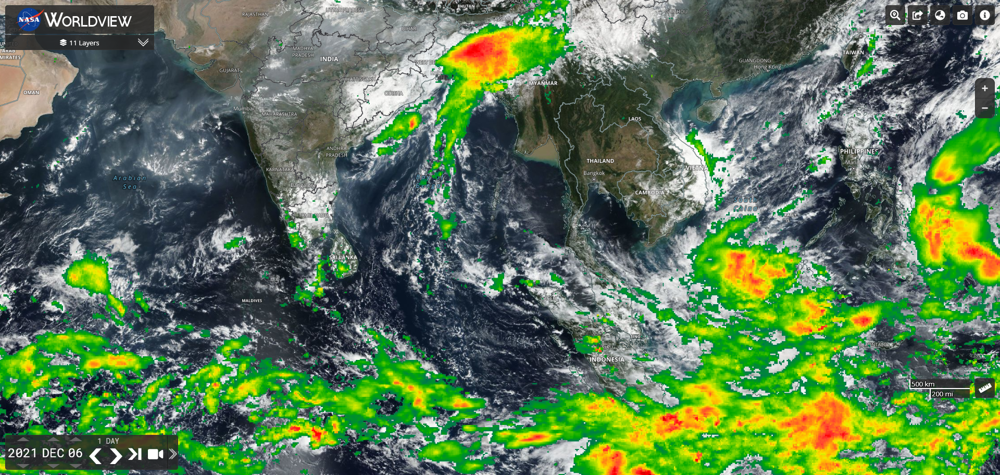

In [4]:
tf.keras.preprocessing.image.load_img('/content/gdrive/MyDrive/Sunik_sample_data/Cyclone_Images/dataset_2/train_set/Cyclonic Storm/Cyclone Jawad 10.png')

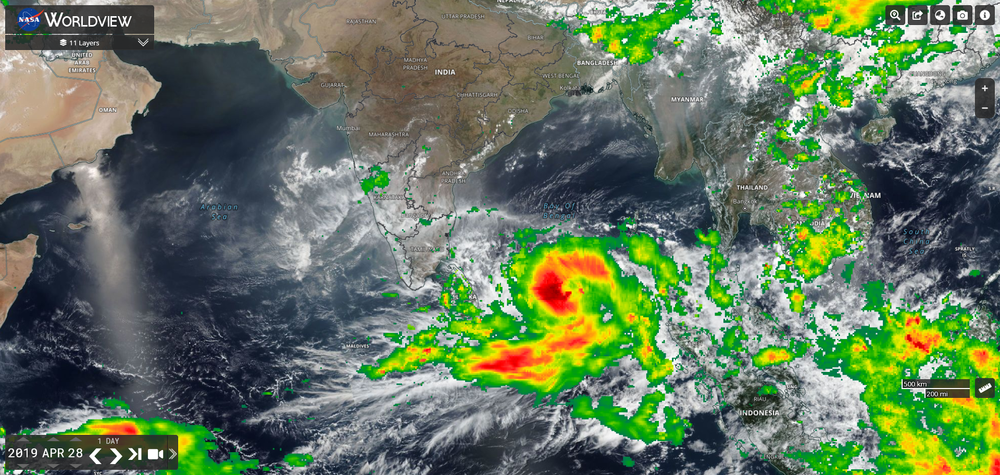

In [5]:
tf.keras.preprocessing.image.load_img('/content/gdrive/MyDrive/Sunik_sample_data/Cyclone_Images/dataset_2/train_set/Extremely Severe Cyclonic Storm/Cyclone Fani 6.png')

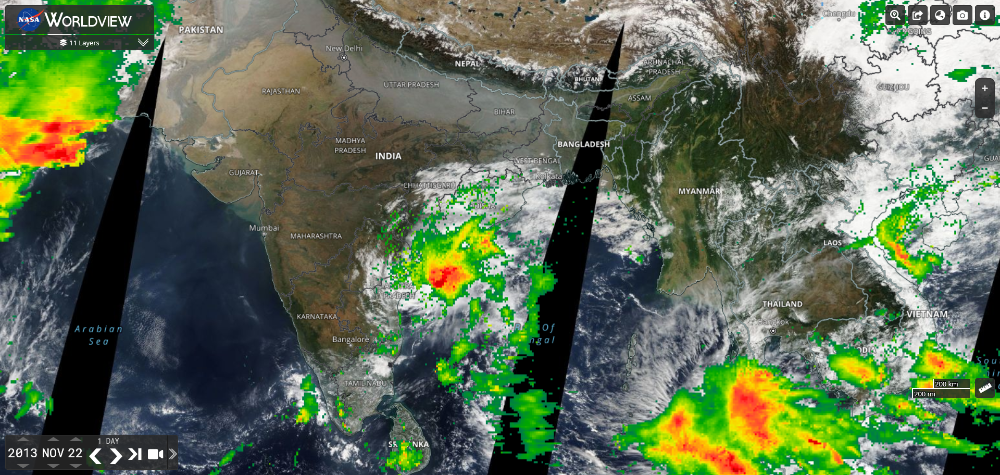

In [6]:
tf.keras.preprocessing.image.load_img('/content/gdrive/MyDrive/Sunik_sample_data/Cyclone_Images/dataset_2/train_set/Severe Cyclonic Storm_46/Cyclone Helen 7.png')



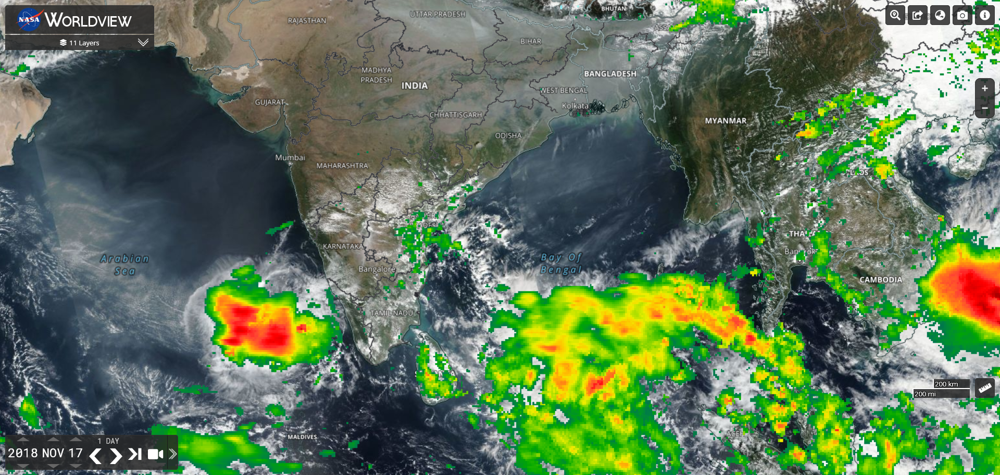

In [7]:
tf.keras.preprocessing.image.load_img('/content/gdrive/MyDrive/Sunik_sample_data/Cyclone_Images/dataset_2/train_set/Very Severe Cyclonic Storm_47/Cyclone Gaja 9.png')

In [8]:
training_datagenerator = ImageDataGenerator(rescale = 1./255,
                                   shear_range=0.2,
                                   zoom_range=0.2,
                                   horizontal_flip= True)

In [9]:
train_dataset=training_datagenerator.flow_from_directory('/content/gdrive/MyDrive/Sunik_sample_data/Cyclone_Images/dataset_2/train_set',
                                                         target_size=(64,64),
                                                         batch_size=32,
                                                         class_mode='categorical',
                                                         shuffle=True)

Found 158 images belonging to 4 classes.


In [10]:
train_dataset.classes

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3], dtype=int32)

In [11]:
train_dataset.class_indices

{'Cyclonic Storm': 0,
 'Extremely Severe Cyclonic Storm': 1,
 'Severe Cyclonic Storm_46': 2,
 'Very Severe Cyclonic Storm_47': 3}

In [12]:
test_datagenrator=ImageDataGenerator(rescale = 1./255)

In [13]:
test_dataset=training_datagenerator.flow_from_directory('/content/gdrive/MyDrive/Sunik_sample_data/Cyclone_Images/dataset_2/test_set_11',
                                                        target_size=(64,64),
                                                        batch_size=1,
                                                        class_mode='categorical',
                                                        shuffle=False)

Found 44 images belonging to 4 classes.


In [ ]:
##BUILDING AND TRAINING THE neural NETWORK

In [ ]:
#num of inputs+num out put/2
(1152+4)/2

578.0

In [14]:
classifier=Sequential()
classifier.add(Conv2D(32,(3,3),input_shape=(64,64,3),activation='relu'))
classifier.add(MaxPool2D(pool_size= (2,2)))

classifier.add(Conv2D(32,(3,3),input_shape=(64,64,3),activation='relu'))
classifier.add(MaxPool2D(pool_size= (2,2)))

classifier.add(Conv2D(32,(3,3),input_shape=(64,64,3),activation='relu'))
classifier.add(MaxPool2D(pool_size= (2,2)))

classifier.add(Flatten())

#classifier.add(Dense(units=128, activation='relu'))
classifier.add(Dense(units=128, activation='relu'))
classifier.add(Dense(units=4, activation='softmax'))

classifier.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 62, 62, 32)        896       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 31, 31, 32)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 29, 29, 32)        9248      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 14, 14, 32)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 12, 12, 32)        9248      
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 6, 6, 32)         0

In [15]:
classifier.compile(optimizer='adam',loss='categorical_crossentropy', metrics=['accuracy'])

In [16]:
hist=classifier.fit_generator(train_dataset,epochs=90,validation_data=train_dataset)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  """Entry point for launching an IPython kernel.


Epoch 1/90
5/5 [==============================] - 80s 16s/step - loss: 1.4211 - accuracy: 0.2152 - val_loss: 1.3762 - val_accuracy: 0.2975
Epoch 2/90
5/5 [==============================] - 20s 4s/step - loss: 1.3738 - accuracy: 0.2911 - val_loss: 1.3715 - val_accuracy: 0.3291
Epoch 3/90
5/5 [==============================] - 20s 4s/step - loss: 1.3720 - accuracy: 0.3608 - val_loss: 1.3609 - val_accuracy: 0.3861
Epoch 4/90
5/5 [==============================] - 20s 4s/step - loss: 1.3518 - accuracy: 0.3228 - val_loss: 1.3344 - val_accuracy: 0.3101
Epoch 5/90
5/5 [==============================] - 20s 4s/step - loss: 1.3325 - accuracy: 0.3544 - val_loss: 1.3134 - val_accuracy: 0.3734
Epoch 6/90
5/5 [==============================] - 20s 4s/step - loss: 1.3106 - accuracy: 0.4051 - val_loss: 1.2745 - val_accuracy: 0.3797
Epoch 7/90
5/5 [==============================] - 20s 4s/step - loss: 1.2575 - accuracy: 0.4494 - val_loss: 1.2260 - val_accuracy: 0.4810
Epoch 8/90
5/5 [=================

In [ ]:
#120=45

In [17]:
classifier.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 62, 62, 32)        896       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 31, 31, 32)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 29, 29, 32)        9248      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 14, 14, 32)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 12, 12, 32)        9248      
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 6, 6, 32)         0

In [18]:
test_dataset.class_indices

{'Cyclonic Storm': 0,
 'Extremely Severe Cyclonic Storm': 1,
 'Severe Cyclonic Storm': 2,
 'Very Severe Cyclonic Storm': 3}

In [19]:
predictions=classifier.predict(test_dataset)
predictions

array([[9.99138236e-01, 4.20092583e-05, 6.96667877e-04, 1.23071193e-04],
       [4.80104089e-02, 9.46193278e-01, 4.01774625e-04, 5.39458962e-03],
       [8.88010681e-01, 4.47504548e-03, 8.44704509e-02, 2.30437070e-02],
       [2.64851063e-01, 2.45523810e-01, 1.13611398e-02, 4.78263944e-01],
       [8.01141679e-01, 8.46954137e-02, 1.13776319e-01, 3.86552769e-04],
       [1.15831204e-01, 6.58028364e-01, 2.23938286e-01, 2.20209546e-03],
       [9.92142797e-01, 7.43174832e-03, 1.17399919e-04, 3.07995389e-04],
       [1.15039527e-01, 5.28638899e-01, 3.50492120e-01, 5.82946977e-03],
       [2.50084046e-03, 9.92851675e-01, 4.45651729e-03, 1.90896841e-04],
       [1.28313974e-02, 9.46791828e-01, 2.33117584e-02, 1.70649234e-02],
       [9.99887466e-01, 9.14388656e-05, 1.62213164e-05, 4.92172103e-06],
       [1.84776127e-05, 7.99389780e-01, 7.76674226e-02, 1.22924238e-01],
       [6.76502590e-04, 9.94589448e-01, 6.91018126e-04, 4.04299283e-03],
       [6.37822726e-04, 6.57857060e-01, 3.32661867e

In [20]:
predictions=np.argmax(predictions,axis=1)
predictions

array([0, 1, 0, 3, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 3,
       2, 0, 2, 2, 1, 2, 1, 0, 2, 2, 2, 3, 1, 3, 3, 1, 3, 2, 1, 3, 3, 3])

In [21]:
test_dataset.class_indices

{'Cyclonic Storm': 0,
 'Extremely Severe Cyclonic Storm': 1,
 'Severe Cyclonic Storm': 2,
 'Very Severe Cyclonic Storm': 3}

In [22]:
test_dataset.classes

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3],
      dtype=int32)

In [23]:
from sklearn.metrics import accuracy_score
accuracy_score(test_dataset.classes, predictions)

0.6363636363636364

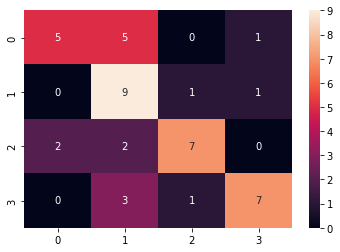

In [24]:
from sklearn.metrics import confusion_matrix
cm=confusion_matrix(test_dataset.classes,predictions)
sns.heatmap(cm,annot=True)

In [25]:
from sklearn.metrics import classification_report
print(classification_report(test_dataset.classes,predictions))

              precision    recall  f1-score   support

           0       0.71      0.45      0.56        11
           1       0.47      0.82      0.60        11
           2       0.78      0.64      0.70        11
           3       0.78      0.64      0.70        11

    accuracy                           0.64        44
   macro avg       0.69      0.64      0.64        44
weighted avg       0.69      0.64      0.64        44



Text(0, 0.5, 'Train and test loss ')

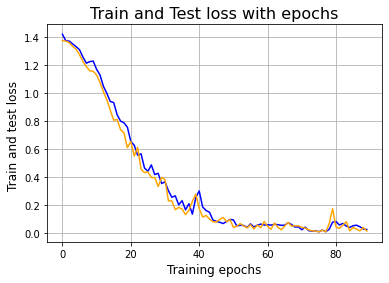

In [26]:
#ploting trsults with accuracy
plt.plot(hist.history['loss'],color='blue',label='train')
plt.plot(hist.history['val_loss'],color='orange',label='train')
plt.grid(True)
plt.title("Train and Test loss with epochs", fontsize=16)
plt.xlabel('Training epochs',fontsize=12)
plt.ylabel('Train and test loss ',fontsize=12)

Text(0, 0.5, 'Train and test accuracy')

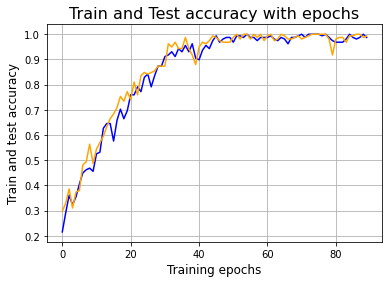

In [27]:
#ploting trsults with accuracy
plt.plot(hist.history['accuracy'],color='blue',label='train')
plt.plot(hist.history['val_accuracy'],color='orange',label='train')
plt.grid(True)
plt.title("Train and Test accuracy with epochs", fontsize=16)
plt.xlabel('Training epochs',fontsize=12)
plt.ylabel('Train and test accuracy',fontsize=12)

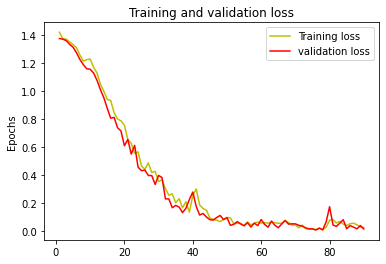

In [30]:
loss=hist.history['loss']
val_loss=hist.history['val_loss']
epochs=range(1,len(loss)+1)
plt.plot(epochs,loss,'y',label='Training loss')
#plt.plot(epochs,loss,'y',label='Training loss')
plt.plot(epochs,val_loss,'r',label='validation loss')
plt.title('Training and validation loss')
plt.ylabel('Epochs')
plt.legend()
plt.show()

In [ ]:
##classifying one single image

In [102]:
image=cv2.imread('/content/gdrive/MyDrive/Sunik_sample_data/Screenshots with Category/tst_val/vscs_12.jpeg')

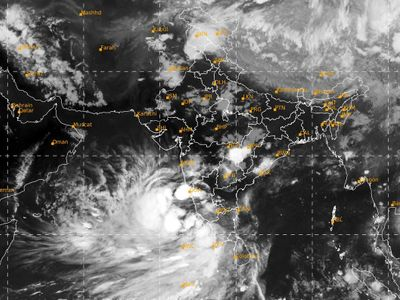

In [103]:
cv2_imshow(image)

In [106]:
image.shape

(64, 64, 3)

In [ ]:
#image

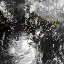

In [107]:
#reshape image
image=cv2.resize(image,(64,64))
cv2_imshow(image)

In [108]:
image

array([[[ 55,  55,  55],
        [ 61,  61,  61],
        [ 72,  72,  72],
        ...,
        [214, 214, 214],
        [205, 205, 205],
        [217, 217, 217]],

       [[ 78,  78,  78],
        [ 99,  99,  99],
        [160, 160, 160],
        ...,
        [221, 221, 221],
        [209, 209, 209],
        [211, 211, 211]],

       [[115, 115, 115],
        [200, 200, 200],
        [193, 193, 193],
        ...,
        [218, 218, 218],
        [205, 205, 205],
        [224, 224, 224]],

       ...,

       [[ 45,  45,  45],
        [ 58,  58,  58],
        [ 36,  36,  36],
        ...,
        [ 62,  62,  62],
        [ 53,  53,  53],
        [ 59,  59,  59]],

       [[ 35,  35,  35],
        [ 48,  48,  48],
        [ 49,  49,  49],
        ...,
        [129, 129, 129],
        [123, 123, 123],
        [ 85,  85,  85]],

       [[ 44,  44,  44],
        [ 40,  40,  40],
        [ 47,  47,  47],
        ...,
        [169, 169, 169],
        [188, 188, 188],
        [ 73,  73,  73]]

In [109]:
image=image/255

In [110]:
image

array([[[0.21568627, 0.21568627, 0.21568627],
        [0.23921569, 0.23921569, 0.23921569],
        [0.28235294, 0.28235294, 0.28235294],
        ...,
        [0.83921569, 0.83921569, 0.83921569],
        [0.80392157, 0.80392157, 0.80392157],
        [0.85098039, 0.85098039, 0.85098039]],

       [[0.30588235, 0.30588235, 0.30588235],
        [0.38823529, 0.38823529, 0.38823529],
        [0.62745098, 0.62745098, 0.62745098],
        ...,
        [0.86666667, 0.86666667, 0.86666667],
        [0.81960784, 0.81960784, 0.81960784],
        [0.82745098, 0.82745098, 0.82745098]],

       [[0.45098039, 0.45098039, 0.45098039],
        [0.78431373, 0.78431373, 0.78431373],
        [0.75686275, 0.75686275, 0.75686275],
        ...,
        [0.85490196, 0.85490196, 0.85490196],
        [0.80392157, 0.80392157, 0.80392157],
        [0.87843137, 0.87843137, 0.87843137]],

       ...,

       [[0.17647059, 0.17647059, 0.17647059],
        [0.22745098, 0.22745098, 0.22745098],
        [0.14117647, 0

In [111]:
image.shape

(64, 64, 3)

In [112]:
image=image.reshape(-1,64,64,3)
image.shape

(1, 64, 64, 3)

In [113]:
result =classifier.predict(image)
result


array([[4.2668072e-04, 5.1350474e-01, 4.8579368e-01, 2.7491458e-04]],
      dtype=float32)

In [114]:
result=np.argmax(result)
result

1

In [115]:
test_dataset.class_indices

{'Cyclonic Storm': 0,
 'Extremely Severe Cyclonic Storm': 1,
 'Severe Cyclonic Storm': 2,
 'Very Severe Cyclonic Storm': 3}

In [ ]:
##while testing with  other sample its not predicting..more testing needed